In [ ]:
# pip install tqdm

In [1]:
# pip install skikit-image

In [1]:
from pytorch_grad_cam import GradCAM, HiResCAM, ScoreCAM, GradCAMPlusPlus, AblationCAM, XGradCAM, EigenCAM, FullGrad
#from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image
from torchvision.models import resnet50, ResNet50_Weights
import numpy as np
import torch
import matplotlib.pyplot as plt
import skimage
import torch.nn as nn

In [2]:
import torchvision.models as tv_models
class Net_TL(nn.Module):
    def __init__(self):
        super().__init__()        
        #use resnet50 as the base model
        #self.resnet50 = tv_models.resnet50(pretrained=True) #old Pytorch
        self.resnet50 = tv_models.resnet50(weights=ResNet50_Weights.DEFAULT)
        #modified the last layer for binary classification  
        self.resnet50.fc=torch.nn.Linear(2048, 1) #new layer          
        #freeze all parameters
        for p in self.resnet50.parameters():
            p.requires_grad = False 
        #set the parameters of layer4 to be trainable       
        for p in self.resnet50.layer4.parameters():
            p.requires_grad = True       
        #set the parameters of fc to be trainable       
        for p in self.resnet50.fc.parameters():
            p.requires_grad = True       
        
    def get_trainable_parameters(self):
        pList=list(self.resnet50.layer4.parameters())+list(self.resnet50.fc.parameters())
        #pList=list(self.resnet50.fc.parameters())
        return pList
    
    def forward(self,x):
        z = self.resnet50(x)
        z = z.view(-1)
        return z

class Net_LS(nn.Module):
    def __init__(self):
        super().__init__()        
        #use resnet50 as the base model
        self.resnet50 = tv_models.resnet50()
        #modified the last layer for binary classification  
        self.resnet50.fc=torch.nn.Linear(2048, 1)          
    
    def forward(self,x):
        z = self.resnet50(x)
        z = z.view(-1)
        return z

In [3]:
#load the network trained on ImageNet
#you need to modify this cell if your network is trained on a different dataset
#  something like this model.load_state_dict(....)
#  read https://pytorch.org/tutorials/beginner/saving_loading_models.html
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
model_TL = Net_TL()
model_TL.load_state_dict(torch.load('t1_TL_best_0.pt', map_location=device)['model_state_dict'])
model_TL.to(device)
model_TL.eval()

model_LS = Net_LS()
model_LS.load_state_dict(torch.load('t1_LS_best_0.pt', map_location=device)['model_state_dict'])
model_LS.to(device)
model_LS.eval()

print(model_TL)

Net_TL(
  (resnet50): ResNet(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Sequential(
          

In [4]:
#choose the target layer(s)
# for n,p in model_TL.named_parameters():
#     print(n,p)
target_layers_TL = [model_TL.resnet50.layer4[-1]]
target_layers_LS = [model_LS.resnet50.layer4[-1]]

(224, 224)


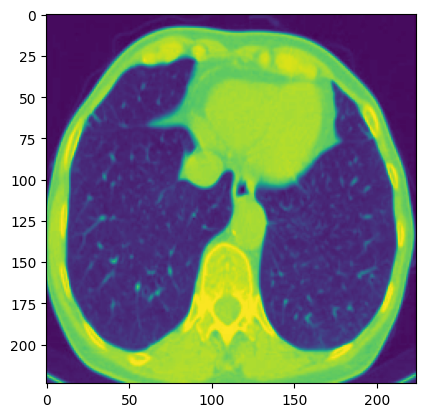

In [5]:
#load a single rgb image from harddrive
import glob
images_class_0 = glob.glob("data/test/0/*")
images_class_1 = glob.glob("data/test/1/*")
image=skimage.io.imread(images_class_0[0])
image=image.astype("float32")
image=image/image.max()
image.shape
print(image.shape)
plt.imshow(image)

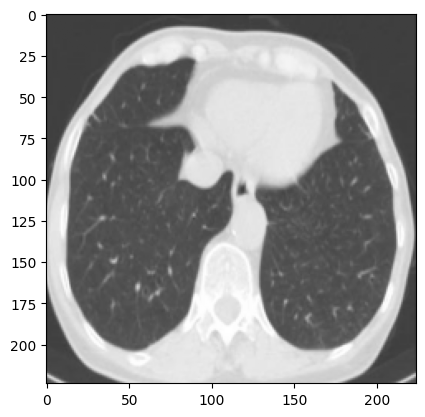

In [6]:
#if the image is gray-scale, then convert it to rgb
if len(image.shape)==2:
    image=image.reshape(224,224,1)
    image=np.concatenate([image, image, image], axis=2)
    plt.imshow(image, cmap='gray')

In [7]:
#convert numpy array to pytorch tensor
image_input=torch.tensor(image).permute(2,0,1) # (224,224,3) to (3,224,224)
image_input=image_input.reshape(1,3,224,224)# a batch that only has one image
image_input.shape

torch.Size([1, 3, 224, 224])

In [37]:
class ClassifierOutputTarget:
    def __init__(self, category):
        self.category = category

    def __call__(self, model_output):
        # print(model_output)
        # if len(model_output.shape) == 1:
        #     return model_output[self.category]
        return model_output

In [9]:
model_output_TL=model_TL(image_input)
model_output_LS=model_LS(image_input)
model_output_TL.shape

torch.Size([1])

In [15]:
# Construct the CAM object once, and then re-use it on many images:
cam_TL = GradCAM(model=model_TL, target_layers=target_layers_TL)
cam_LS = GradCAM(model=model_LS, target_layers=target_layers_LS)

# You can also use it within a with statement, to make sure it is freed,
# In case you need to re-create it inside an outer loop:
# with GradCAM(model=model, target_layers=target_layers, use_cuda=args.use_cuda) as cam:
#   ...

# We have to specify the target we want to generate
# the Class Activation Maps for.
# If targets is None, the highest scoring category
# will be used for every image in the batch.
# Here we use ClassifierOutputTarget, but you can define your own custom targets
# That are, for example, combinations of categories, or specific outputs in a non standard model.

# https://deeplearning.cms.waikato.ac.nz/user-guide/class-maps/IMAGENET/
#category 281 is tabby, tabby cat
targets = [ClassifierOutputTarget(category=0)]

# You can also pass aug_smooth=True and eigen_smooth=True, to apply smoothing.
# pay attention to the shape of each input
grayscale_cam_TL = cam_TL(input_tensor=image_input, targets=targets)
grayscale_cam_LS = cam_LS(input_tensor=image_input, targets=targets)
grayscale_cam_TL.shape

tensor(1.1127, grad_fn=<UnbindBackward0>)
tensor(1.4222, grad_fn=<UnbindBackward0>)


(1, 224, 224)

In [17]:
grayscale_cam_TL,grayscale_cam_LS=grayscale_cam_TL[0],grayscale_cam_LS[0]
grayscale_cam_TL.shape

(224, 224)

Text(0.5, 1.0, 'Learning from scratch')

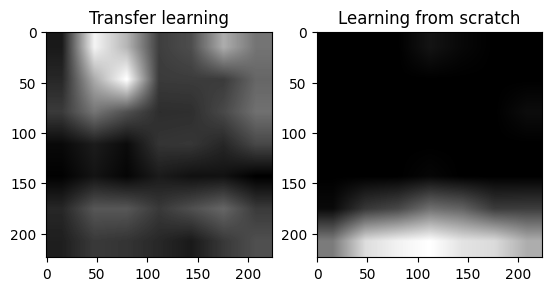

In [26]:
fig, ax = plt.subplots(1,2)
ax[0].imshow(grayscale_cam_TL, cmap='gray')
ax[0].set_title('Transfer learning')
ax[1].imshow(grayscale_cam_LS, cmap='gray')
ax[1].set_title('Learning from scratch')

In [27]:
# In this example grayscale_cam has only one image in the batch:
cam_image_TL = show_cam_on_image(image, grayscale_cam_TL, use_rgb=True)
cam_image_LS = show_cam_on_image(image, grayscale_cam_LS, use_rgb=True)

In [29]:
cam_image_TL.shape

(224, 224, 3)

Text(0.5, 1.0, 'Learning from scratch')

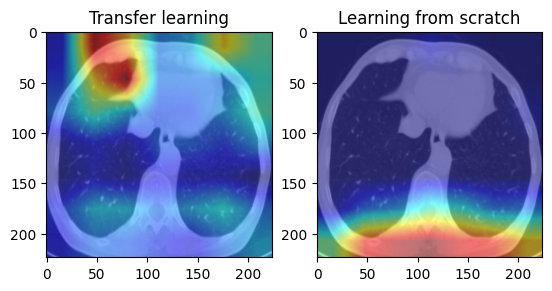

In [30]:
fig, ax = plt.subplots(1,2)
ax[0].imshow(cam_image_TL)
ax[0].set_title('Transfer learning')
ax[1].imshow(cam_image_LS)
ax[1].set_title('Learning from scratch')

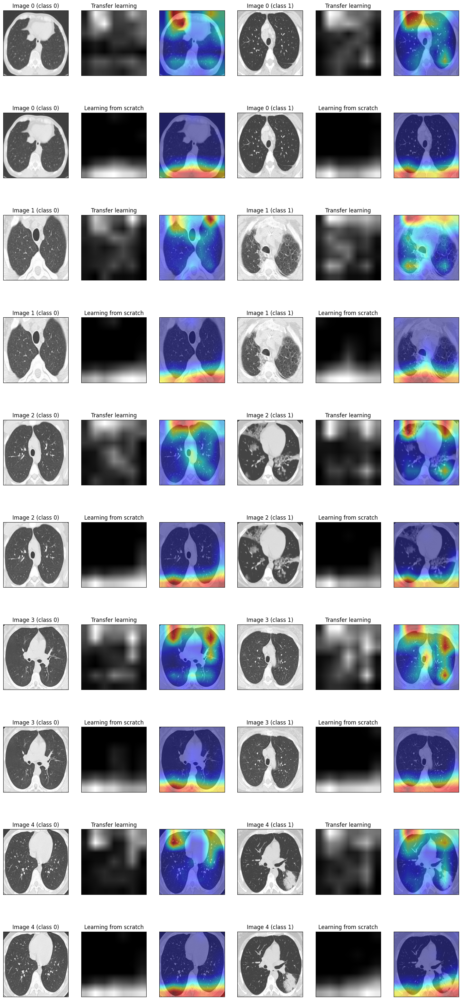

In [64]:
#GradCAM
fig, ax = plt.subplots(10,6, figsize=(18,40))
cam_TL, cam_LS = GradCAM(model=model_TL, target_layers=target_layers_TL), GradCAM(model=model_LS, target_layers=target_layers_LS)
images = [images_class_0,images_class_1]
for j,class_ in enumerate(images):
    for i,image in enumerate(class_[:5]):
        image=skimage.io.imread(image)
        image=image.astype("float32")
        image=image/image.max()
        if len(image.shape)==2:
            image=image.reshape(224,224,1)
            image=np.concatenate([image, image, image], axis=2)
        image_input=torch.tensor(image).permute(2,0,1) # (224,224,3) to (3,224,224)
        image_input=image_input.reshape(1,3,224,224)# a batch that only has one image
    
        grayscale_cam_TL = cam_TL(input_tensor=image_input, targets=targets)[0]
        grayscale_cam_LS = cam_LS(input_tensor=image_input, targets=targets)[0]
    
        cam_image_TL = show_cam_on_image(image, grayscale_cam_TL, use_rgb=True)
        cam_image_LS = show_cam_on_image(image, grayscale_cam_LS, use_rgb=True)
    
        ax[2*i][3*j+0].imshow(image)
        ax[2*i][3*j+1].imshow(grayscale_cam_TL, cmap='gray')
        ax[2*i][3*j+2].imshow(cam_image_TL)
        ax[2*i][3*j+0].set_title(f'Image {i} (class {j})')
        ax[2*i][3*j+1].set_title('Transfer learning')
        ax[2*i][3*j+0].set_xticks([])
        ax[2*i][3*j+0].set_yticks([])
        ax[2*i][3*j+1].set_xticks([])
        ax[2*i][3*j+1].set_yticks([])
        ax[2*i][3*j+2].set_xticks([])
        ax[2*i][3*j+2].set_yticks([])
        ax[2*i+1][3*j+0].imshow(image)
        ax[2*i+1][3*j+1].imshow(grayscale_cam_LS, cmap='gray')
        ax[2*i+1][3*j+2].imshow(cam_image_LS)
        ax[2*i+1][3*j+0].set_title(f'Image {i} (class {j})')
        ax[2*i+1][3*j+1].set_title('Learning from scratch')
        ax[2*i+1][3*j+0].set_xticks([])
        ax[2*i+1][3*j+0].set_yticks([])
        ax[2*i+1][3*j+1].set_xticks([])
        ax[2*i+1][3*j+1].set_yticks([])
        ax[2*i+1][3*j+2].set_xticks([])
        ax[2*i+1][3*j+2].set_yticks([])

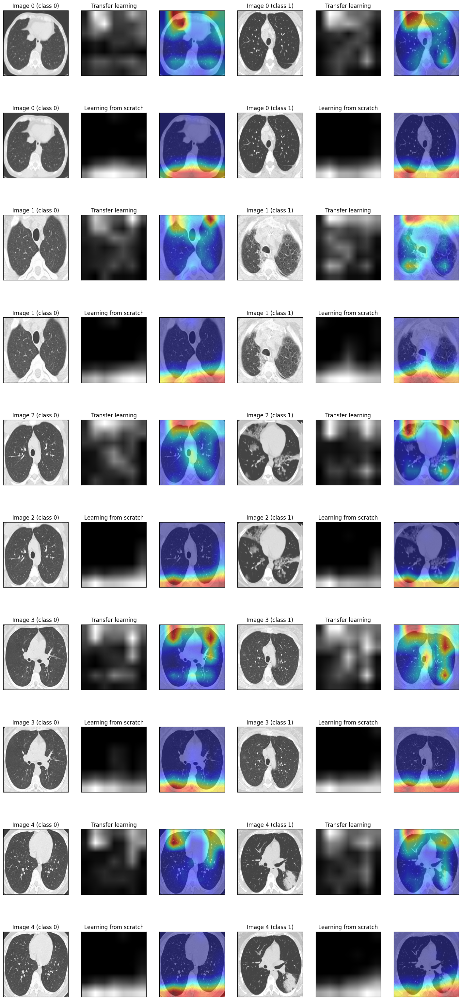

In [65]:
#HiResCAM
fig, ax = plt.subplots(10,6, figsize=(18,40))
cam_TL, cam_LS = HiResCAM(model=model_TL, target_layers=target_layers_TL), GradCAM(model=model_LS, target_layers=target_layers_LS)
images = [images_class_0,images_class_1]
for j,class_ in enumerate(images):
    for i,image in enumerate(class_[:5]):
        image=skimage.io.imread(image)
        image=image.astype("float32")
        image=image/image.max()
        if len(image.shape)==2:
            image=image.reshape(224,224,1)
            image=np.concatenate([image, image, image], axis=2)
        image_input=torch.tensor(image).permute(2,0,1) # (224,224,3) to (3,224,224)
        image_input=image_input.reshape(1,3,224,224)# a batch that only has one image
    
        grayscale_cam_TL = cam_TL(input_tensor=image_input, targets=targets)[0]
        grayscale_cam_LS = cam_LS(input_tensor=image_input, targets=targets)[0]
    
        cam_image_TL = show_cam_on_image(image, grayscale_cam_TL, use_rgb=True)
        cam_image_LS = show_cam_on_image(image, grayscale_cam_LS, use_rgb=True)
    
        ax[2*i][3*j+0].imshow(image)
        ax[2*i][3*j+1].imshow(grayscale_cam_TL, cmap='gray')
        ax[2*i][3*j+2].imshow(cam_image_TL)
        ax[2*i][3*j+0].set_title(f'Image {i} (class {j})')
        ax[2*i][3*j+1].set_title('Transfer learning')
        ax[2*i][3*j+0].set_xticks([])
        ax[2*i][3*j+0].set_yticks([])
        ax[2*i][3*j+1].set_xticks([])
        ax[2*i][3*j+1].set_yticks([])
        ax[2*i][3*j+2].set_xticks([])
        ax[2*i][3*j+2].set_yticks([])
        ax[2*i+1][3*j+0].imshow(image)
        ax[2*i+1][3*j+1].imshow(grayscale_cam_LS, cmap='gray')
        ax[2*i+1][3*j+2].imshow(cam_image_LS)
        ax[2*i+1][3*j+0].set_title(f'Image {i} (class {j})')
        ax[2*i+1][3*j+1].set_title('Learning from scratch')
        ax[2*i+1][3*j+0].set_xticks([])
        ax[2*i+1][3*j+0].set_yticks([])
        ax[2*i+1][3*j+1].set_xticks([])
        ax[2*i+1][3*j+1].set_yticks([])
        ax[2*i+1][3*j+2].set_xticks([])
        ax[2*i+1][3*j+2].set_yticks([])

In [67]:
# takes too long
# #ScoreCAM
# cam_TL, cam_LS = ScoreCAM(model=model_TL, target_layers=target_layers_TL), GradCAM(model=model_LS, target_layers=target_layers_LS)
# targets = [ClassifierOutputTarget(category=0)]
# grayscale_cam_TL, grayscale_cam_LS = cam_TL(input_tensor=image_input, targets=targets)[0], cam_LS(input_tensor=image_input, targets=targets)[0]
# cam_image_TL, cam_iamge_LS = show_cam_on_image(image, grayscale_cam_TL, use_rgb=True), show_cam_on_image(image, grayscale_cam_LS, use_rgb=True)
# fig, ax = plt.subplots(2,3, figsize=(10,10))
# ax[0][0].imshow(image)
# ax[0][1].imshow(grayscale_cam_TL, cmap='gray')
# ax[0][2].imshow(cam_image_TL)
# ax[0][0].set_title('TL')
# ax[1][0].imshow(image)
# ax[1][1].imshow(grayscale_cam_LS, cmap='gray')
# ax[1][2].imshow(cam_image_LS)
# ax[1][0].set_title('LS')

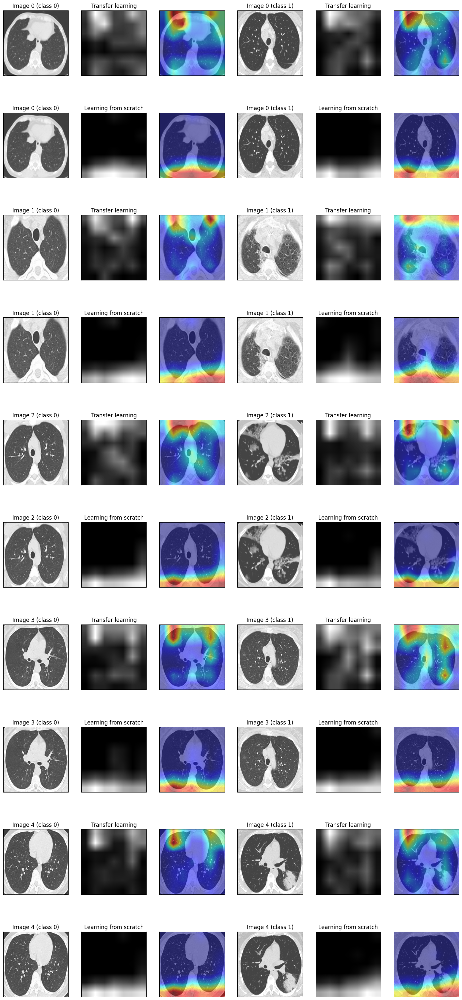

In [68]:
#GradCAMPlusPlus
fig, ax = plt.subplots(10,6, figsize=(18,40))
cam_TL, cam_LS = GradCAMPlusPlus(model=model_TL, target_layers=target_layers_TL), GradCAM(model=model_LS, target_layers=target_layers_LS)
images = [images_class_0,images_class_1]
for j,class_ in enumerate(images):
    for i,image in enumerate(class_[:5]):
        image=skimage.io.imread(image)
        image=image.astype("float32")
        image=image/image.max()
        if len(image.shape)==2:
            image=image.reshape(224,224,1)
            image=np.concatenate([image, image, image], axis=2)
        image_input=torch.tensor(image).permute(2,0,1) # (224,224,3) to (3,224,224)
        image_input=image_input.reshape(1,3,224,224)# a batch that only has one image
    
        grayscale_cam_TL = cam_TL(input_tensor=image_input, targets=targets)[0]
        grayscale_cam_LS = cam_LS(input_tensor=image_input, targets=targets)[0]
    
        cam_image_TL = show_cam_on_image(image, grayscale_cam_TL, use_rgb=True)
        cam_image_LS = show_cam_on_image(image, grayscale_cam_LS, use_rgb=True)
    
        ax[2*i][3*j+0].imshow(image)
        ax[2*i][3*j+1].imshow(grayscale_cam_TL, cmap='gray')
        ax[2*i][3*j+2].imshow(cam_image_TL)
        ax[2*i][3*j+0].set_title(f'Image {i} (class {j})')
        ax[2*i][3*j+1].set_title('Transfer learning')
        ax[2*i][3*j+0].set_xticks([])
        ax[2*i][3*j+0].set_yticks([])
        ax[2*i][3*j+1].set_xticks([])
        ax[2*i][3*j+1].set_yticks([])
        ax[2*i][3*j+2].set_xticks([])
        ax[2*i][3*j+2].set_yticks([])
        ax[2*i+1][3*j+0].imshow(image)
        ax[2*i+1][3*j+1].imshow(grayscale_cam_LS, cmap='gray')
        ax[2*i+1][3*j+2].imshow(cam_image_LS)
        ax[2*i+1][3*j+0].set_title(f'Image {i} (class {j})')
        ax[2*i+1][3*j+1].set_title('Learning from scratch')
        ax[2*i+1][3*j+0].set_xticks([])
        ax[2*i+1][3*j+0].set_yticks([])
        ax[2*i+1][3*j+1].set_xticks([])
        ax[2*i+1][3*j+1].set_yticks([])
        ax[2*i+1][3*j+2].set_xticks([])
        ax[2*i+1][3*j+2].set_yticks([])

In [69]:
# took too long
# #AblationCAM
# cam_TL, cam_LS = AblationCAM(model=model_TL, target_layers=target_layers_TL), GradCAM(model=model_LS, target_layers=target_layers_LS)
# targets = [ClassifierOutputTarget(category=0)]
# grayscale_cam_TL, grayscale_cam_LS = cam_TL(input_tensor=image_input, targets=targets)[0], cam_LS(input_tensor=image_input, targets=targets)[0]
# cam_image_TL, cam_iamge_LS = show_cam_on_image(image, grayscale_cam_TL, use_rgb=True), show_cam_on_image(image, grayscale_cam_LS, use_rgb=True)
# fig, ax = plt.subplots(2,3, figsize=(10,10))
# ax[0][0].imshow(image)
# ax[0][1].imshow(grayscale_cam_TL, cmap='gray')
# ax[0][2].imshow(cam_image_TL)
# ax[0][0].set_title('TL')
# ax[1][0].imshow(image)
# ax[1][1].imshow(grayscale_cam_LS, cmap='gray')
# ax[1][2].imshow(cam_image_LS)
# ax[1][0].set_title('LS')

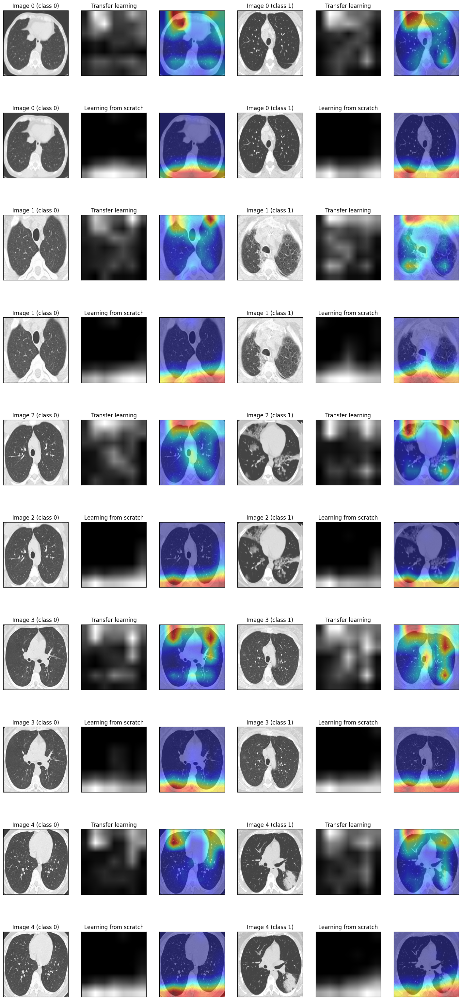

In [70]:
#XGradCAM
fig, ax = plt.subplots(10,6, figsize=(18,40))
cam_TL, cam_LS = XGradCAM(model=model_TL, target_layers=target_layers_TL), GradCAM(model=model_LS, target_layers=target_layers_LS)
images = [images_class_0,images_class_1]
for j,class_ in enumerate(images):
    for i,image in enumerate(class_[:5]):
        image=skimage.io.imread(image)
        image=image.astype("float32")
        image=image/image.max()
        if len(image.shape)==2:
            image=image.reshape(224,224,1)
            image=np.concatenate([image, image, image], axis=2)
        image_input=torch.tensor(image).permute(2,0,1) # (224,224,3) to (3,224,224)
        image_input=image_input.reshape(1,3,224,224)# a batch that only has one image
    
        grayscale_cam_TL = cam_TL(input_tensor=image_input, targets=targets)[0]
        grayscale_cam_LS = cam_LS(input_tensor=image_input, targets=targets)[0]
    
        cam_image_TL = show_cam_on_image(image, grayscale_cam_TL, use_rgb=True)
        cam_image_LS = show_cam_on_image(image, grayscale_cam_LS, use_rgb=True)
    
        ax[2*i][3*j+0].imshow(image)
        ax[2*i][3*j+1].imshow(grayscale_cam_TL, cmap='gray')
        ax[2*i][3*j+2].imshow(cam_image_TL)
        ax[2*i][3*j+0].set_title(f'Image {i} (class {j})')
        ax[2*i][3*j+1].set_title('Transfer learning')
        ax[2*i][3*j+0].set_xticks([])
        ax[2*i][3*j+0].set_yticks([])
        ax[2*i][3*j+1].set_xticks([])
        ax[2*i][3*j+1].set_yticks([])
        ax[2*i][3*j+2].set_xticks([])
        ax[2*i][3*j+2].set_yticks([])
        ax[2*i+1][3*j+0].imshow(image)
        ax[2*i+1][3*j+1].imshow(grayscale_cam_LS, cmap='gray')
        ax[2*i+1][3*j+2].imshow(cam_image_LS)
        ax[2*i+1][3*j+0].set_title(f'Image {i} (class {j})')
        ax[2*i+1][3*j+1].set_title('Learning from scratch')
        ax[2*i+1][3*j+0].set_xticks([])
        ax[2*i+1][3*j+0].set_yticks([])
        ax[2*i+1][3*j+1].set_xticks([])
        ax[2*i+1][3*j+1].set_yticks([])
        ax[2*i+1][3*j+2].set_xticks([])
        ax[2*i+1][3*j+2].set_yticks([])

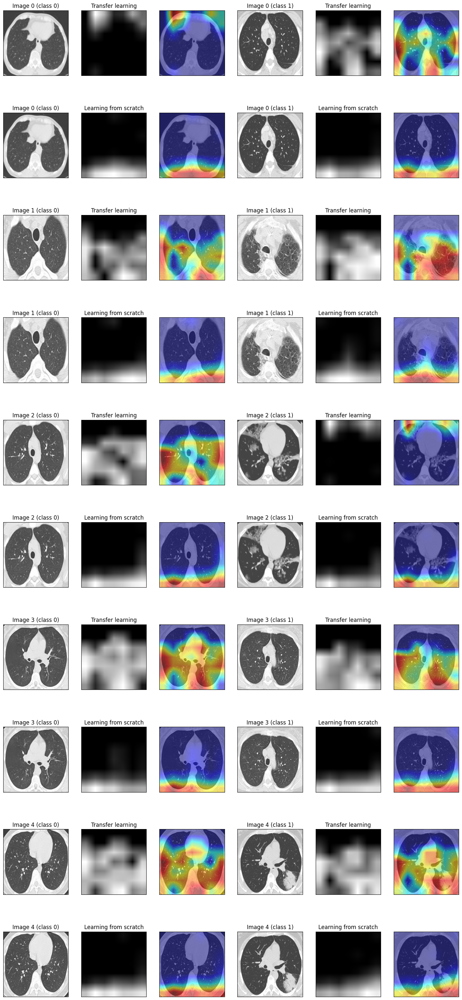

In [71]:
#EigenCAM
fig, ax = plt.subplots(10,6, figsize=(18,40))
cam_TL, cam_LS = EigenCAM(model=model_TL, target_layers=target_layers_TL), GradCAM(model=model_LS, target_layers=target_layers_LS)
images = [images_class_0,images_class_1]
for j,class_ in enumerate(images):
    for i,image in enumerate(class_[:5]):
        image=skimage.io.imread(image)
        image=image.astype("float32")
        image=image/image.max()
        if len(image.shape)==2:
            image=image.reshape(224,224,1)
            image=np.concatenate([image, image, image], axis=2)
        image_input=torch.tensor(image).permute(2,0,1) # (224,224,3) to (3,224,224)
        image_input=image_input.reshape(1,3,224,224)# a batch that only has one image
    
        grayscale_cam_TL = cam_TL(input_tensor=image_input, targets=targets)[0]
        grayscale_cam_LS = cam_LS(input_tensor=image_input, targets=targets)[0]
    
        cam_image_TL = show_cam_on_image(image, grayscale_cam_TL, use_rgb=True)
        cam_image_LS = show_cam_on_image(image, grayscale_cam_LS, use_rgb=True)
    
        ax[2*i][3*j+0].imshow(image)
        ax[2*i][3*j+1].imshow(grayscale_cam_TL, cmap='gray')
        ax[2*i][3*j+2].imshow(cam_image_TL)
        ax[2*i][3*j+0].set_title(f'Image {i} (class {j})')
        ax[2*i][3*j+1].set_title('Transfer learning')
        ax[2*i][3*j+0].set_xticks([])
        ax[2*i][3*j+0].set_yticks([])
        ax[2*i][3*j+1].set_xticks([])
        ax[2*i][3*j+1].set_yticks([])
        ax[2*i][3*j+2].set_xticks([])
        ax[2*i][3*j+2].set_yticks([])
        ax[2*i+1][3*j+0].imshow(image)
        ax[2*i+1][3*j+1].imshow(grayscale_cam_LS, cmap='gray')
        ax[2*i+1][3*j+2].imshow(cam_image_LS)
        ax[2*i+1][3*j+0].set_title(f'Image {i} (class {j})')
        ax[2*i+1][3*j+1].set_title('Learning from scratch')
        ax[2*i+1][3*j+0].set_xticks([])
        ax[2*i+1][3*j+0].set_yticks([])
        ax[2*i+1][3*j+1].set_xticks([])
        ax[2*i+1][3*j+1].set_yticks([])
        ax[2*i+1][3*j+2].set_xticks([])
        ax[2*i+1][3*j+2].set_yticks([])

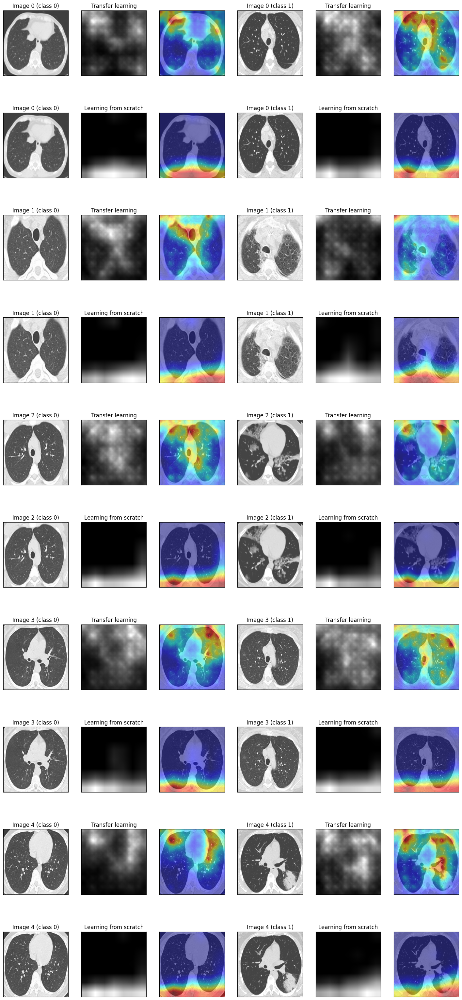

In [72]:
#FullGrad
fig, ax = plt.subplots(10,6, figsize=(18,40))
cam_TL, cam_LS = FullGrad(model=model_TL, target_layers=target_layers_TL), GradCAM(model=model_LS, target_layers=target_layers_LS)
images = [images_class_0,images_class_1]
for j,class_ in enumerate(images):
    for i,image in enumerate(class_[:5]):
        image=skimage.io.imread(image)
        image=image.astype("float32")
        image=image/image.max()
        if len(image.shape)==2:
            image=image.reshape(224,224,1)
            image=np.concatenate([image, image, image], axis=2)
        image_input=torch.tensor(image).permute(2,0,1) # (224,224,3) to (3,224,224)
        image_input=image_input.reshape(1,3,224,224)# a batch that only has one image
    
        grayscale_cam_TL = cam_TL(input_tensor=image_input, targets=targets)[0]
        grayscale_cam_LS = cam_LS(input_tensor=image_input, targets=targets)[0]
    
        cam_image_TL = show_cam_on_image(image, grayscale_cam_TL, use_rgb=True)
        cam_image_LS = show_cam_on_image(image, grayscale_cam_LS, use_rgb=True)
    
        ax[2*i][3*j+0].imshow(image)
        ax[2*i][3*j+1].imshow(grayscale_cam_TL, cmap='gray')
        ax[2*i][3*j+2].imshow(cam_image_TL)
        ax[2*i][3*j+0].set_title(f'Image {i} (class {j})')
        ax[2*i][3*j+1].set_title('Transfer learning')
        ax[2*i][3*j+0].set_xticks([])
        ax[2*i][3*j+0].set_yticks([])
        ax[2*i][3*j+1].set_xticks([])
        ax[2*i][3*j+1].set_yticks([])
        ax[2*i][3*j+2].set_xticks([])
        ax[2*i][3*j+2].set_yticks([])
        ax[2*i+1][3*j+0].imshow(image)
        ax[2*i+1][3*j+1].imshow(grayscale_cam_LS, cmap='gray')
        ax[2*i+1][3*j+2].imshow(cam_image_LS)
        ax[2*i+1][3*j+0].set_title(f'Image {i} (class {j})')
        ax[2*i+1][3*j+1].set_title('Learning from scratch')
        ax[2*i+1][3*j+0].set_xticks([])
        ax[2*i+1][3*j+0].set_yticks([])
        ax[2*i+1][3*j+1].set_xticks([])
        ax[2*i+1][3*j+1].set_yticks([])
        ax[2*i+1][3*j+2].set_xticks([])
        ax[2*i+1][3*j+2].set_yticks([])